# **Exploratory data analysis of the food deserts in the United States**



## Load data
We loaded data.

In [3]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns 

In [4]:
# reset default color palette
plt.rcdefaults()

In [5]:
fd = pd.read_excel("https://github.com/20JUNE22/capstone2023/raw/main/Food_2019.xlsx")
 
fd

,CensusTract,State,County,EastofUS,Urban,GroupQuartersFlag,LowIncomeTracts,NUMGQTRS,PCTGQTRS,PovertyRate,...,TractWhite,TractBlack,TractAsian,TractNHOPI,TractAIAN,TractOMultir,TractHispanic,TractHUNV,TractSNAP,FoodDesert
0,1001020100,Alabama,Autauga County,1,1,0,0,0.0,0.00,11.3,...,1622,217,14,0,14,45,44,6,102,1
1,1001020200,Alabama,Autauga County,1,1,0,1,181.0,8.34,17.9,...,888,1217,5,0,5,55,75,89,156,1
2,1001020300,Alabama,Autauga County,1,1,0,0,0.0,0.00,15.0,...,2576,647,17,5,11,117,87,99,172,1
3,1001020400,Alabama,Autauga County,1,1,0,0,0.0,0.00,2.8,...,4086,193,18,4,11,74,85,21,98,1
4,1001020500,Alabama,Autauga County,1,1,0,0,181.0,1.68,15.2,...,8666,1437,296,9,48,310,355,230,339,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72522,56043000200,Wyoming,Washakie County,0,0,0,0,57.0,1.71,9.7,...,3106,6,15,0,27,172,309,61,64,1
72523,56043000301,Wyoming,Washakie County,0,1,0,0,10.0,0.38,11.6,...,2377,5,23,0,40,220,446,88,41,0
72524,56043000302,Wyoming,Washakie County,0,1,0,0,73.0,2.87,16.3,...,2312,11,10,1,26,182,407,23,64,0
72525,56045951100,Wyoming,Weston County,0,0,0,0,252.0,7.60,17.5,...,3179,15,10,1,47,62,91,47,34,1


## Data Inspection

> Description of variables


*   Census Tract : Unique geographic region number
*   State : The name of State
*   East of US: 1: East, 0: West of the US
*   County : The name of County
*   Urban : Urban status (1:urban, 0: rural)
*   GroupQuartersFlag : Residence in group quarter (1 : more than 67% population in group quarters, 0: less than 67%)
*   LowIncomeTracts : Low income area(1 : the poverty rate >20%, 0: < 20%)
*   NUMGQTRS : Count of tract population residing in group quarters
*   PCTGQTRS : Percent of tract population residing in group quarters
*   PovertyRate : The share of the tract population living with income at or below the poverty thresholds by family size
*   MedianFamilyIncome : Median family income($)
*   TractKids : the total of population of children age 0-17 
*   TractSeniors : The taotal of tract population of seniors age 65+ 
*   TractWhite : The total of tract population of White
*   TrackBlack : The total of tract population of Black
*   TrackAsian : The total of tract population of Asian
*   TrackNHOPI : The total of tract population of Native Hawaiian and other Pacific Islander 
*   TrackAIAN : The total of tract population of American Indian and Alaska Native 
*   TrackOMultir : The total of tract population of Other / Multiple race
*   TrackHispanic : The total of tract population of Hispanic of Latino
*   TrackHUNV : The total of tract population of housing units without a vehicle
*   TrackSNAP :The total of tract population of house units receiving SNAP benefits
*   FoodDesrt :1: Food desert, 0: not







In [6]:
fd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72527 entries, 0 to 72526
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   CensusTract         72527 non-null  int64  
 1   State               72527 non-null  object 
 2   County              72527 non-null  object 
 3   EastofUS            72527 non-null  int64  
 4   Urban               72527 non-null  int64  
 5   GroupQuartersFlag   72527 non-null  int64  
 6   LowIncomeTracts     72527 non-null  int64  
 7   NUMGQTRS            72506 non-null  float64
 8   PCTGQTRS            72506 non-null  float64
 9   PovertyRate         72527 non-null  float64
 10  MedianFamilyIncome  71782 non-null  float64
 11  TractKids           72527 non-null  int64  
 12  TractSeniors        72527 non-null  int64  
 13  TractWhite          72527 non-null  int64  
 14  TractBlack          72527 non-null  int64  
 15  TractAsian          72527 non-null  int64  
 16  Trac

>  Checking missing value

In [7]:
missing_values = fd.isnull().sum()

print(missing_values)

CensusTract             0
State                   0
County                  0
EastofUS                0
Urban                   0
GroupQuartersFlag       0
LowIncomeTracts         0
NUMGQTRS               21
PCTGQTRS               21
PovertyRate             0
MedianFamilyIncome    745
TractKids               0
TractSeniors            0
TractWhite              0
TractBlack              0
TractAsian              0
TractNHOPI              0
TractAIAN               0
TractOMultir            0
TractHispanic           0
TractHUNV               0
TractSNAP               0
FoodDesert              0
dtype: int64


### Findings
- The raw data has 72531 rows and 147 columns.
- This truncated data loaded has total 72527 rows and 23 columns. 
- Variables for dimensions are State, County, Urban, GroupQuarters, and LowIncome. 
- Variables for factors are `PovertyRate`, `MedianFamilyIncome`,`NUMGQTRS`,`PCTGQTRS`,`TractKids`, `TractSeniors`, `TractWhite`, `TractBlack`, `TractAsian`, `TractNHOPI`, `TractAIAN`, `TractOMultir`, `TractHispanic`, `TractHUNV`, and `TractSNAP`.
- Target variable is FoodDesert.
- There were 21 missing values in `NUMGQTRS` and `PCTGQTRS` respectively and 745 missing values in MedianFamilyIncome.
- Both `NUMGQTRS` and `PCTGQTRS` are highly related each other. Using the percentage as a predictor may provide a more meaningful and interpretable measure of level of residential segregation. 

### Questions
- Should we drop any variable related each other?
- How to handle the missing values?

### Next step
- Since missing values constitute only about 1% of the data, we can remove them without significantly affecting the analysis.
- We can exclude the count of residents in group quarters (`NUMGQTRS`) from analysis  



##  Data Cleaning

> Dropping missing values

In [8]:
fd = fd.dropna()

fd.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 71761 entries, 0 to 72526
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   CensusTract         71761 non-null  int64  
 1   State               71761 non-null  object 
 2   County              71761 non-null  object 
 3   EastofUS            71761 non-null  int64  
 4   Urban               71761 non-null  int64  
 5   GroupQuartersFlag   71761 non-null  int64  
 6   LowIncomeTracts     71761 non-null  int64  
 7   NUMGQTRS            71761 non-null  float64
 8   PCTGQTRS            71761 non-null  float64
 9   PovertyRate         71761 non-null  float64
 10  MedianFamilyIncome  71761 non-null  float64
 11  TractKids           71761 non-null  int64  
 12  TractSeniors        71761 non-null  int64  
 13  TractWhite          71761 non-null  int64  
 14  TractBlack          71761 non-null  int64  
 15  TractAsian          71761 non-null  int64  
 16  Trac

> Excluding irrelevant inputs
- `CensusTract`: Unique key
- `State`: `EastofUS`(1:East States,0:West States) will be used instead.
- `County` : `EastofWA`(1: East County, 0:West County) will be used instead.
- `NUMGQTRS` : `PCTGQTRS` will be used for group quarters.

In [9]:
# drop the irrelevant inputs
df = fd.drop(['CensusTract', 'State', 'County','NUMGQTRS'], axis=1)

df.head()

,EastofUS,Urban,GroupQuartersFlag,LowIncomeTracts,PCTGQTRS,PovertyRate,MedianFamilyIncome,TractKids,TractSeniors,TractWhite,TractBlack,TractAsian,TractNHOPI,TractAIAN,TractOMultir,TractHispanic,TractHUNV,TractSNAP,FoodDesert
0,1,1,0,0,0.00,11.3,81250.0,507,221,1622,217,14,0,14,45,44,6,102,1
1,1,1,0,1,8.34,17.9,49000.0,606,214,888,1217,5,0,5,55,75,89,156,1
2,1,1,0,0,0.00,15.0,62609.0,894,439,2576,647,17,5,11,117,87,99,172,1
3,1,1,0,0,0.00,2.8,70607.0,1015,904,4086,193,18,4,11,74,85,21,98,1
4,1,1,0,0,1.68,15.2,96334.0,3162,1126,8666,1437,296,9,48,310,355,230,339,1


## Correlation Analysis



,EastofUS,Urban,GroupQuartersFlag,LowIncomeTracts,PCTGQTRS,PovertyRate,MedianFamilyIncome,TractKids,TractSeniors,TractWhite,TractBlack,TractAsian,TractNHOPI,TractAIAN,TractOMultir,TractHispanic,TractHUNV,TractSNAP,FoodDesert
EastofUS,1.000000,-0.107856,-0.004943,0.010588,0.026525,0.042636,-0.090513,-0.080433,0.036349,0.035209,0.185824,-0.261007,-0.210571,-0.126837,-0.381978,-0.277681,0.061093,0.077000,0.054406
Urban,-0.107856,1.000000,0.013066,0.092708,0.020016,0.090793,0.098811,0.048872,-0.076120,-0.136421,0.162398,0.207635,0.045288,-0.083462,0.219675,0.205891,0.179611,0.085067,0.227671
GroupQuartersFlag,-0.004943,0.013066,1.000000,0.024020,0.574015,0.064047,0.003444,-0.071481,-0.065441,0.004455,0.021828,0.019354,0.008098,0.004056,-0.001363,-0.000875,-0.018329,-0.044748,0.009377
LowIncomeTracts,0.010588,0.092708,0.024020,1.000000,0.095882,0.700796,-0.629279,-0.044200,-0.204866,-0.345435,0.290132,-0.088904,0.014809,0.081692,0.256226,0.234214,0.239071,0.524229,-0.126936
PCTGQTRS,0.026525,0.020016,0.574015,0.095882,1.000000,0.173247,-0.042161,-0.149727,-0.062866,-0.012550,0.069993,-0.006229,0.008537,0.006353,-0.033989,-0.035705,0.042986,-0.014606,0.016419
PovertyRate,0.042636,0.090793,0.064047,0.700796,0.173247,1.000000,-0.657718,-0.071922,-0.245246,-0.367992,0.336773,-0.124129,-0.007405,0.108026,0.197827,0.193238,0.299373,0.596786,-0.129530
MedianFamilyIncome,-0.090513,0.098811,0.003444,-0.629279,-0.042161,-0.657718,1.000000,0.028421,0.111195,0.258041,-0.269876,0.246208,-0.000917,-0.093179,-0.196525,-0.197915,-0.110006,-0.553065,0.105815
TractKids,-0.080433,0.048872,-0.071481,-0.044200,-0.149727,-0.071922,0.028421,1.000000,0.255530,0.632477,0.223152,0.227351,0.109456,0.098105,0.496356,0.484611,0.022356,0.348703,0.180552
TractSeniors,0.036349,-0.076120,-0.065441,-0.204866,-0.062866,-0.245246,0.111195,0.255530,1.000000,0.586725,-0.050165,0.063955,0.012622,-0.009368,-0.059879,-0.030694,0.086281,0.094241,0.157089
TractWhite,0.035209,-0.136421,0.004455,-0.345435,-0.012550,-0.367992,0.258041,0.632477,0.586725,1.000000,-0.304332,0.018114,-0.025974,-0.029567,0.020129,0.095084,-0.082940,0.003272,0.214549


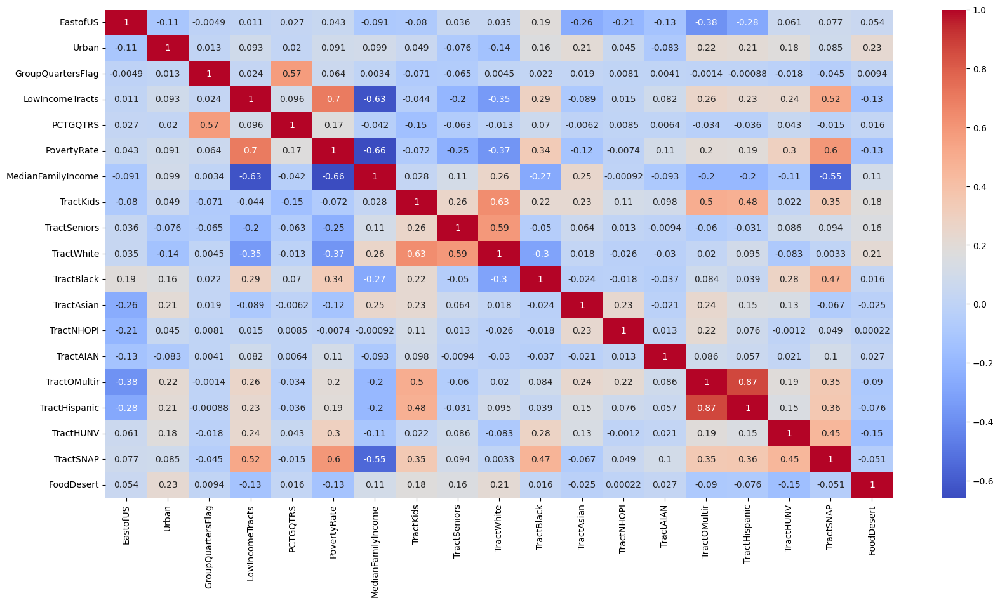

In [10]:
# Checking the correlation by creating a heatmap
plt.figure(figsize=(20,10))
c= df.corr()
sns.heatmap(c,cmap="coolwarm",annot=True)
c

In [11]:
# # create a pair plot
# sns.pairplot(df, hue='FoodDesert')


# plt.show()

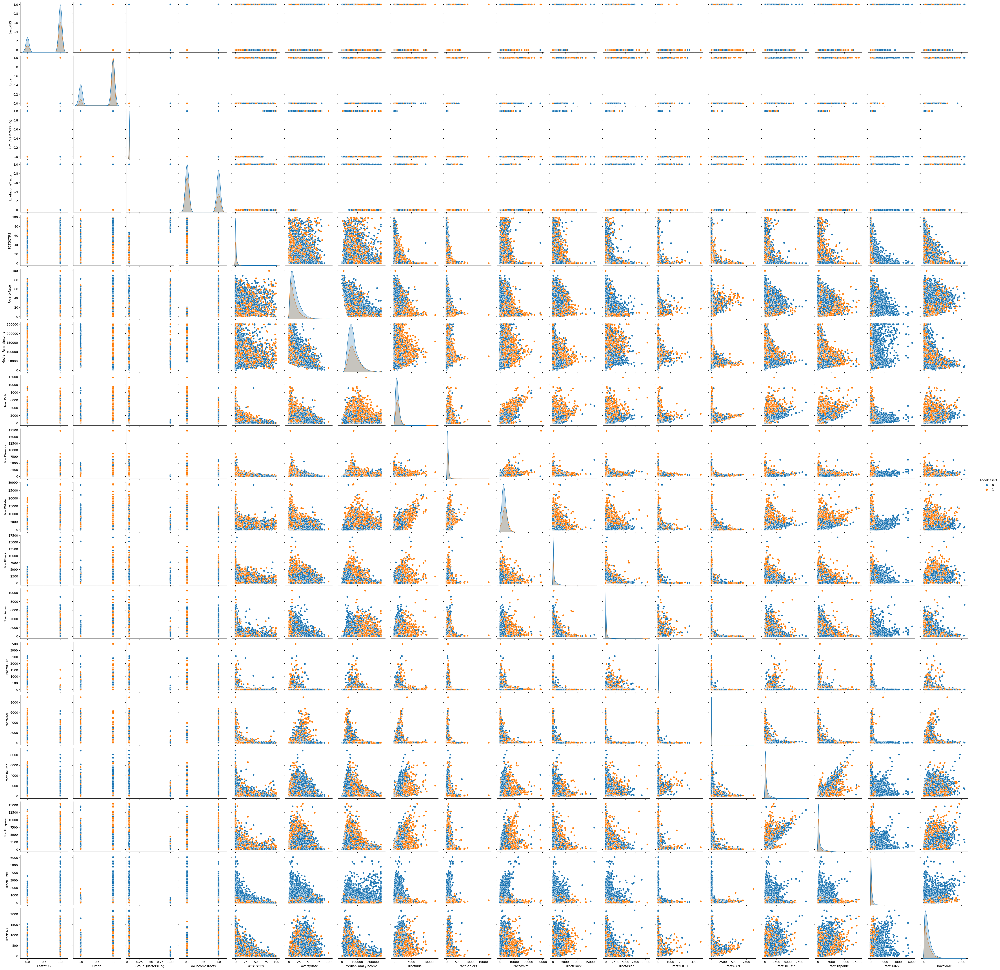

In [12]:
# the pairplot is taking too long to generate. So we saved the plot in github.

import requests
from PIL import Image

url = 'https://github.com/20JUNE22/capstone2023/raw/main/pairplot.png'
response = requests.get(url, stream=True)

img = Image.open(response.raw)
img.show()

### Findings
- `TractOMutir` and `TractHispanic` have a strong correlation (0.87)
- `LowIncomeTracts` and `PovertyRate` have a moderate strong correlation (0.7)
- `PovertyRate` and `MedianFamilyIncome` have a moderate correlation(0.66)
- `TractKids` and `TractWhite` have a moderate correlation (0.63)


## Factors Analysis

> * There are 14 factors.
*  We will check outliers and distribution of each factor.

In [13]:
# creating subsets for factors
factors = df.iloc[:, 4:18] # all factors


factors1 = factors.iloc[:,0:2] # PCTGQTRS, PovertyRate  
factors2 = factors.iloc[:,3:5] # Tractkids, TractSeniors
factors3 = factors.iloc[:,5:12] # TractWhite to TrackHispanic 
factors4 = factors.iloc[:,12:14] # TractHUNV  TractSNAP


print(factors)
print(factors1)
print(factors2)
print(factors3)
print(factors4)

       PCTGQTRS  PovertyRate  MedianFamilyIncome  TractKids  TractSeniors  \
0          0.00         11.3             81250.0        507           221   
1          8.34         17.9             49000.0        606           214   
2          0.00         15.0             62609.0        894           439   
3          0.00          2.8             70607.0       1015           904   
4          1.68         15.2             96334.0       3162          1126   
...         ...          ...                 ...        ...           ...   
72522      1.71          9.7             67254.0        884           593   
72523      0.38         11.6             64152.0        674           399   
72524      2.87         16.3             69605.0        614           516   
72525      7.60         17.5             74500.0        655           499   
72526      1.57         17.3             76838.0        918           650   

       TractWhite  TractBlack  TractAsian  TractNHOPI  TractAIAN  \
0      

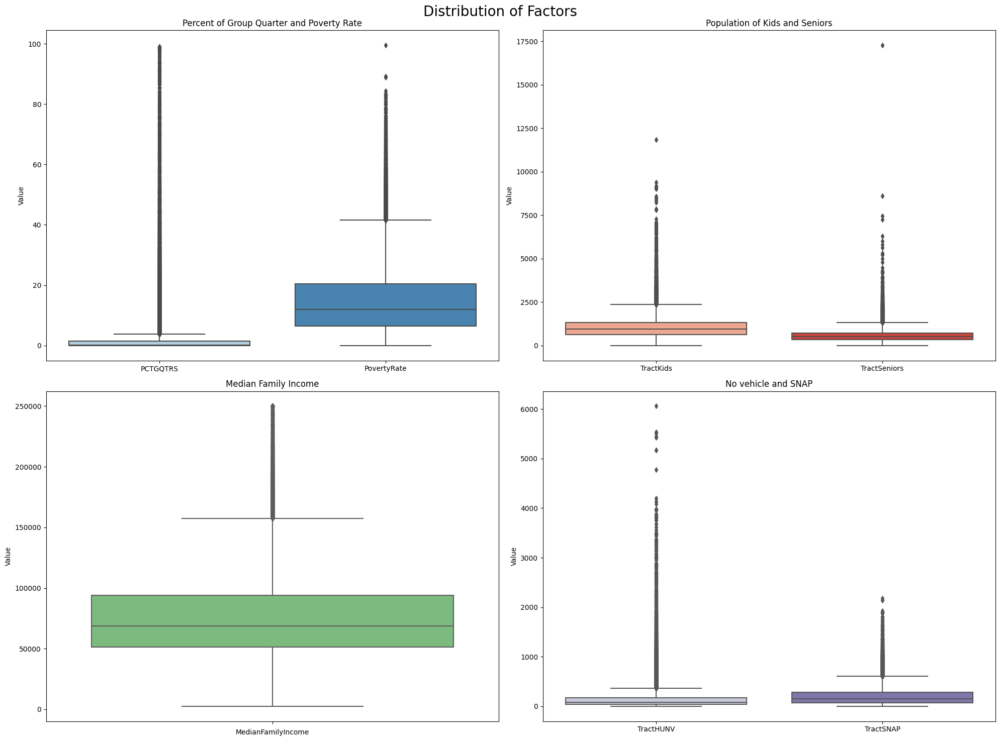

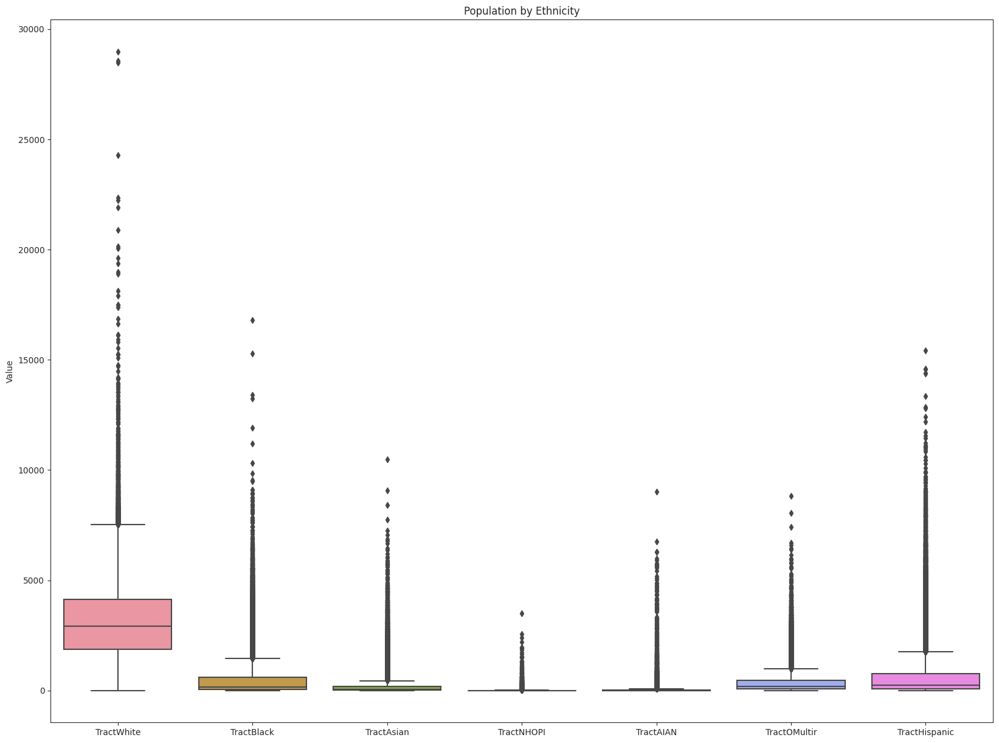

In [14]:
# set up subplots with 2 rows and 2 columns
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(20, 15))

# checking distribution for Percent of Group Quarter and Poverty Rate
sns.boxplot(data=factors1, ax=axs[0, 0], palette="Blues")
axs[0, 0].set_title('Percent of Group Quarter and Poverty Rate')
axs[0, 0].set_ylabel('Value')

# checking distribution for distribution of the TrackKids and TrackSeniors
sns.boxplot(data=factors2, ax=axs[0, 1], palette="Reds")
axs[0, 1].set_title('Population of Kids and Seniors')
axs[0, 1].set_ylabel('Value')
axs[0, 1].set_xticklabels(axs[0, 1].get_xticklabels())

# checking distribution for Median income
sns.boxplot(y=df['MedianFamilyIncome'], ax=axs[1, 0], palette="Greens")
axs[1, 0].set_xlabel('MedianFamilyIncome')
axs[1, 0].set_ylabel('Value')
axs[1, 0].set_title('Median Family Income')
axs[1, 0].set_xticklabels(axs[1, 0].get_xticklabels())

# checking distribution for distribution of the TractHUNV and TractSNAP
sns.boxplot(data=factors4, ax=axs[1, 1], palette="Purples")
axs[1, 1].set_title('No vehicle and SNAP')
axs[1, 1].set_ylabel('Value')
axs[1, 1].set_xticklabels(axs[1, 1].get_xticklabels())


# set overall title for the figure
fig.suptitle('Distribution of Factors', fontsize=20)

# adjust spacing between subplots
fig.tight_layout()

# display the plot
plt.show()

plt.figure(figsize=(20, 15))
sns.set_style("ticks")
sns.set_palette("husl")

# checking distribution for distribution of the population by ethnicity
sns.boxplot(data=factors3)

plt.ylabel('Value')
plt.title('Population by Ethnicity')
plt.show()



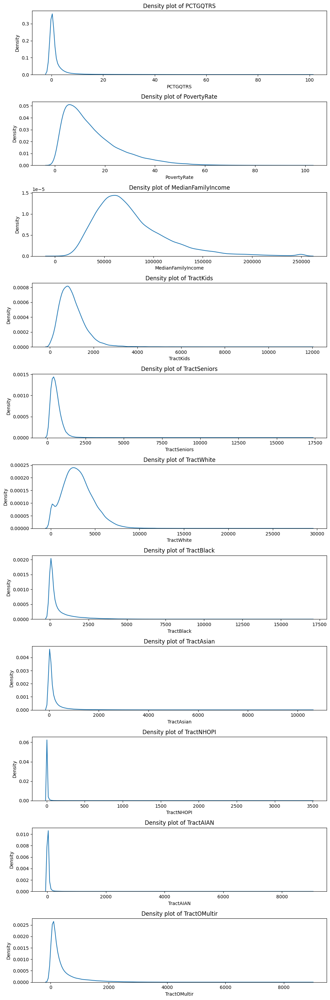

In [18]:
# reset default color palette
plt.rcdefaults()

fig, axes = plt.subplots(nrows=11, ncols=1, figsize=(10, 30))
# Use a loop to create a density plot to check distribution for each column
for i, ax in enumerate(axes.flatten()):
    if i < len(factors.columns):
        column = factors.columns[i]
        sns.kdeplot(data=factors, x=column, ax=ax)
        ax.set_title(f"Density plot of {column}")
        ax.set_xlabel(column)
        ax.set_ylabel("Density")

# Adjust the layout of the plots and show the figure
plt.tight_layout()
plt.show()

Text(0.5, 0.98, 'Food Desert analysis by PovertyRate and MedianFamilyIncome')

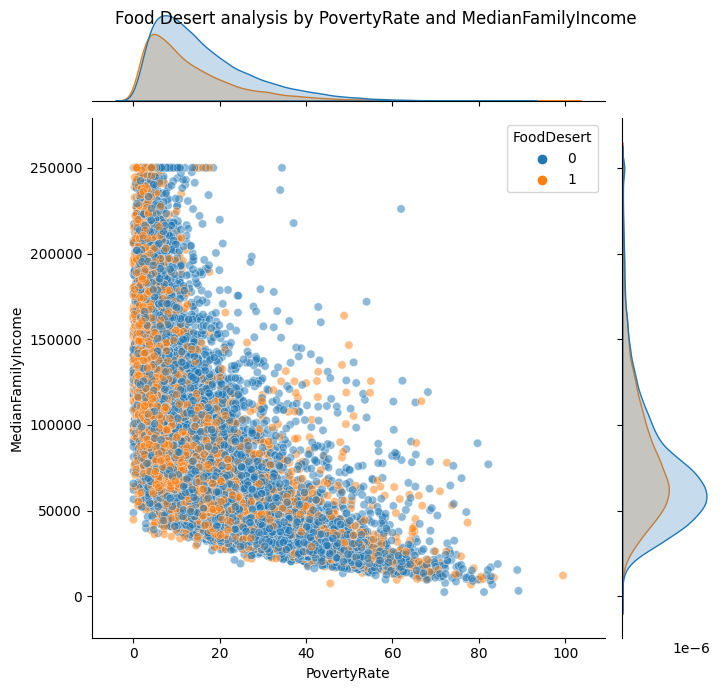

In [ ]:
# reset default color palette
plt.rcdefaults()

# Compare and analyze PovertyRate and MedianFamilyIncome by Food Desert

fig_jointplt_fooddesert = sns.jointplot(data=df, x='PovertyRate', y='MedianFamilyIncome',
                                        hue="FoodDesert",height=7,alpha=0.5)
fig_jointplt_fooddesert.figure.suptitle("Food Desert analysis by PovertyRate and MedianFamilyIncome")

Text(0.5, 0.98, 'Food Desert analysis by Kids and White')

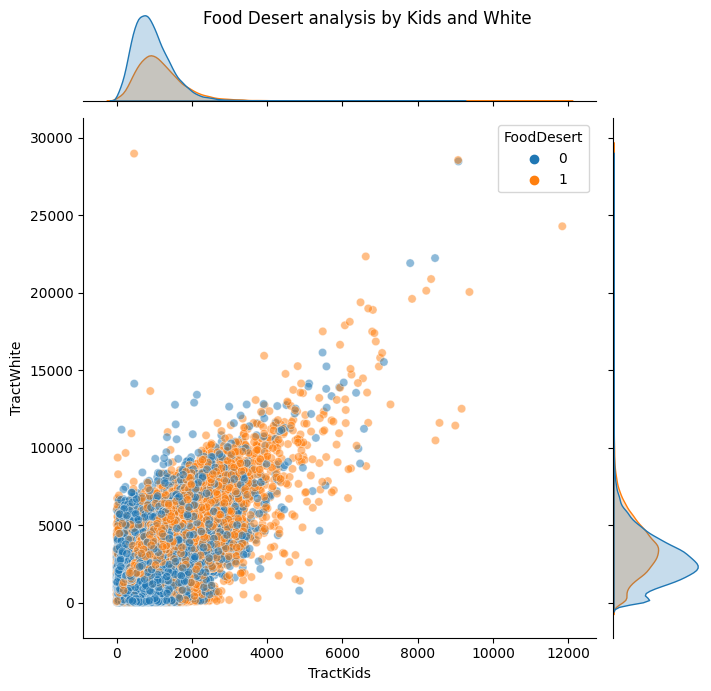

In [ ]:
# Compare and analyze TractKids and TractWhite population by Food Desert
fig_jointplt_fooddesert = sns.jointplot(data=df, x='TractKids', y='TractWhite',
                                        hue="FoodDesert",height=7,alpha=0.5)
fig_jointplt_fooddesert.figure.suptitle("Food Desert analysis by Kids and White")

Text(0.5, 0.98, 'Food Desert analysis by OMultir and Hispanic')

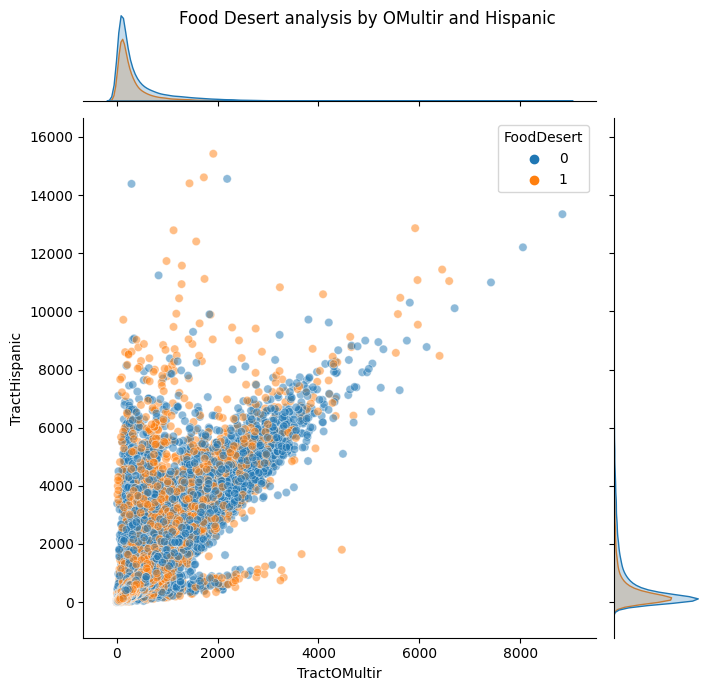

In [ ]:
# Compare and analyze Multirace and Hispanic population by Food Desert
fig_jointplt_fooddesert = sns.jointplot(data=fd, x='TractOMultir', y='TractHispanic',
                                        hue="FoodDesert",height=7,alpha=0.5)
fig_jointplt_fooddesert.figure.suptitle("Food Desert analysis by OMultir and Hispanic")

Text(0.5, 0.98, 'Food Desert analysis by HUNV and SNAP')

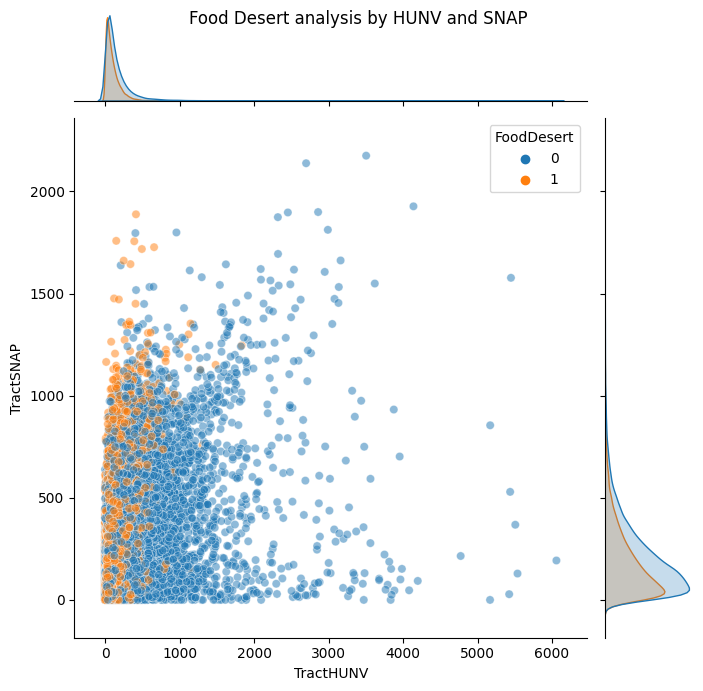

In [ ]:
# Compare and analyze TractHUNV and TractSNAP and Hispanic population by Food Desert
fig_jointplt_fooddesert = sns.jointplot(data=fd, x='TractHUNV', y='TractSNAP', 
                                        hue='FoodDesert',height=7,alpha=0.5)
fig_jointplt_fooddesert.figure.suptitle('Food Desert analysis by HUNV and SNAP')

### Findings
- There are a lot of outliers present in all factors.
- All factors are right skewed.
- All density plots show unimodal distribusion.
- `PovertyRate` and `MedianFamilyIncome` have negative correlation. They have significant overlap on Food desert (1).
- The `TractKids` and `TractWhite` have positive correlation. 
- The `TractOMultir` and `TractHispanic` show simlar pattern and redundancies. `TractHispanic`is more likely to be related with the Target varaible, `FoodDesert`.
- The `TractHUNV` has higher correlation with `FoodDesert` than `TractSNAP`.

### Things to consider
- Those outliers may represent valid data points that are not errors but rather still relevant to the analysis. It may be appropriate to leave the outliers in the data.
- Transforming the data can help to reduce the impact of outliers.

## Dimension Analysis

In [ ]:
dim_df = df.iloc[:, :4]

dim_df

,EastofUS,Urban,GroupQuartersFlag,LowIncomeTracts
0,1,1,0,0
1,1,1,0,1
2,1,1,0,0
3,1,1,0,0
4,1,1,0,0
...,...,...,...,...
72522,0,0,0,0
72523,0,1,0,0
72524,0,1,0,0
72525,0,0,0,0


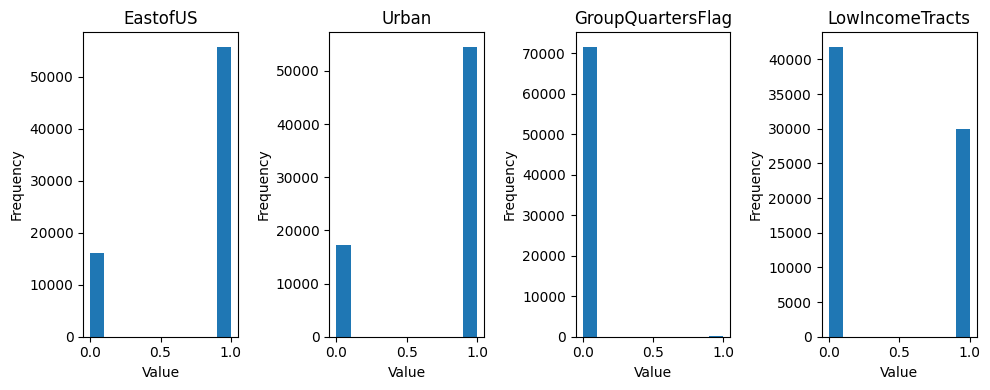

In [ ]:
# Create a figure with four subplots
fig, axs = plt.subplots(1, 4, figsize=(10, 4))

for i in range(4):
    axs[i].hist(dim_df.iloc[:, i])
    axs[i].set_title(dim_df.columns.to_list()[i])
    axs[i].set_xlabel('Value')
    axs[i].set_ylabel('Frequency')

# Show the plot
plt.tight_layout()
plt.show()

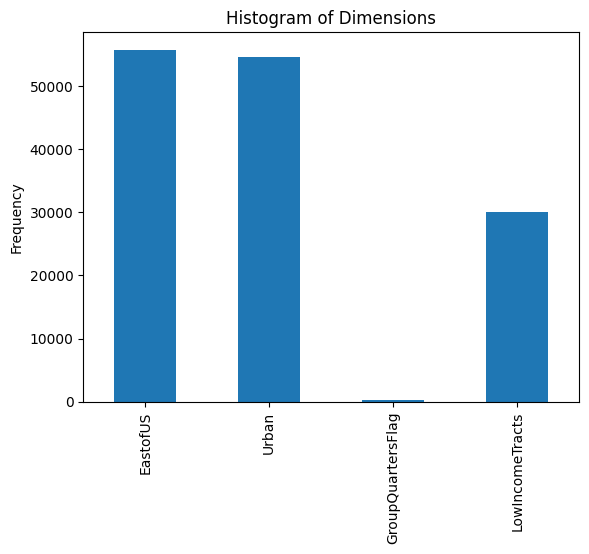

In [ ]:
freqs = dim_df.sum()

# Create a bar chart of the frequencies
freqs.plot(kind='bar')

# plt.xlabel('Column Name')
plt.ylabel('Frequency')
plt.title('Histogram of Dimensions')

plt.show()				

### Findings
* `GroupQuarters` has siginificantly imbalanced.
* The frequency of dimensions show that `GroupQuarters` relatively too low.
* `GroupQuarters` is not appropriate to be used as a dimension. We can drop this dimension. 


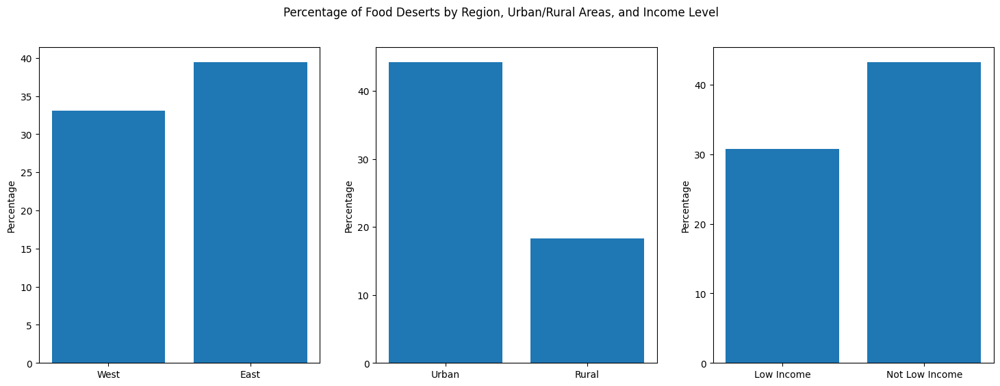

In [ ]:
# Divide the dataset into two subsets based on EastofUS column
west_us = df[df['EastofUS'] == 0]
east_us = df[df['EastofUS'] == 1]

# Calculate percentage of food deserts in each region
west_food_desert_perc = (west_us['FoodDesert'].sum() / len(west_us)) * 100
east_food_desert_perc = (east_us['FoodDesert'].sum() / len(east_us)) * 100

# Create a bar chart to display the percentage of food deserts in the West and East regions
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
axs[0].bar(['West', 'East'], [west_food_desert_perc, east_food_desert_perc])
# axs[0].set_title('Percentage of Food Deserts in the West and East Regions')
axs[0].set_ylabel('Percentage')

# Divide the dataset into two subsets based on Urban column
Urban = df[df['Urban'] == 1]
Rural = df[df['Urban'] == 0]

# Calculate percentage of food deserts in each area
urban_food_desert_perc = (Urban['FoodDesert'].sum() / len(Urban)) * 100
rural_food_desert_perc = (Rural['FoodDesert'].sum() / len(Rural)) * 100

# Create a bar chart to display the percentage of food deserts in the Urban and Rural areas
axs[1].bar(['Urban', 'Rural'], [urban_food_desert_perc, rural_food_desert_perc])
# axs[1].set_title('Percentage of Food Deserts in the Urban and Rural areas')
axs[1].set_ylabel('Percentage')

# Divide the dataset into two subsets based on LowIncomeTracts column
low_income = df[df['LowIncomeTracts'] == 1]
not_low_income = df[df['LowIncomeTracts'] == 0]

# Calculate percentage of food deserts in each subset
low_income_food_desert_perc = (low_income['FoodDesert'].sum() / len(low_income)) * 100
not_low_income_food_desert_perc = (not_low_income['FoodDesert'].sum() / len(not_low_income)) * 100

# Create a bar chart to display the percentage of food deserts in low income and not low income areas
axs[2].bar(['Low Income', 'Not Low Income'], [low_income_food_desert_perc, not_low_income_food_desert_perc])
# axs[2].set_title('Percentage of Food Deserts in Low Income and Not Low Income Areas')
axs[2].set_ylabel('Percentage')

# Add a subtitle to the figure
fig.suptitle('Percentage of Food Deserts by Region, Urban/Rural Areas, and Income Level')

plt.show()

In [ ]:
wa = pd.read_excel("https://github.com/20JUNE22/capstone2023/raw/main/wa.xlsx")
 
wa.head()

,State,County,EastofWA,PCTGQTRS,PovertyRate,MedianFamilyIncome,TractKids,TractSeniors,TractWhite,TractBlack,...,log10_TractSeniors,log10_TractWhite,log10_TractBlack,log10_TractAsian,log10_TractNHOPI,log10_TractAIAN,log10_TractOMultir,log10_TractHispanic,log10_TractHUNV,log10_TractSNAP
0,Washington,Adams County,1,2.41,11.0,67703,534,516,2326,2,...,2.713491,3.366796,0.477121,1.079181,0.000000,1.397940,1.929419,2.053078,1.944483,2.212188
1,Washington,Adams County,1,0.00,18.2,62500,435,305,1524,24,...,2.485721,3.183270,1.397940,1.113943,0.477121,1.041393,2.222716,2.307496,1.204120,2.103804
2,Washington,Adams County,1,0.42,29.0,42900,2656,477,3747,48,...,2.679428,3.573800,1.690196,1.204120,0.477121,2.217484,3.471145,3.704494,2.096910,2.589950
3,Washington,Adams County,1,2.59,27.0,55521,1018,330,1764,13,...,2.519828,3.246745,1.146128,1.477121,0.000000,1.707570,3.000434,3.295347,2.060698,2.264818
4,Washington,Adams County,1,0.00,28.0,57831,1869,287,2342,22,...,2.459392,3.369772,1.361728,1.770852,0.000000,2.037426,3.347135,3.574031,1.041393,2.469822


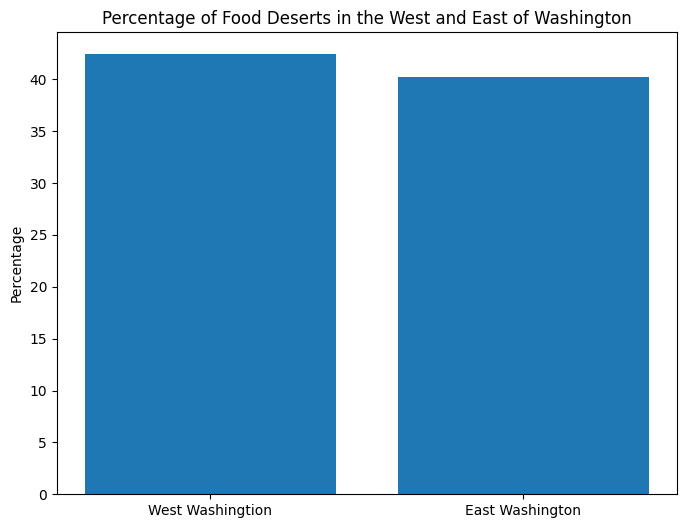

In [ ]:
# Divide the dataset into two subsets based on EastofWA column
west_wa = wa[wa['EastofWA'] == 0]
east_wa = wa[wa['EastofWA'] == 1]

# Calculate percentage of food deserts in each region
westwa_food_desert_perc = (west_wa['FoodDesert'].sum() / len(west_wa)) * 100
eastwa_food_desert_perc = (east_wa['FoodDesert'].sum() / len(east_wa)) * 100

# Create a bar chart to display the percentage of food deserts in the West and East regions
fig, ax = plt.subplots(figsize=(8, 6))
ax.bar(['West Washingtion', 'East Washington'], [westwa_food_desert_perc, eastwa_food_desert_perc])
ax.set_title('Percentage of Food Deserts in the West and East of Washington')
ax.set_ylabel('Percentage')
plt.show()

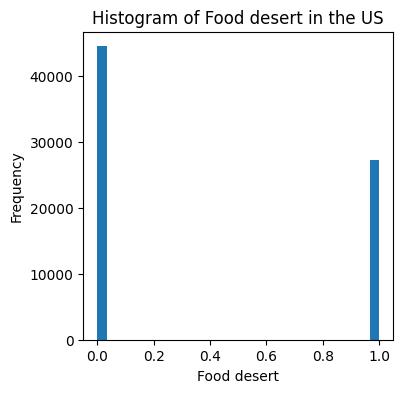

In [ ]:
dim_df = df['FoodDesert']

# create histogram
fig, axs = plt.subplots(1, 1, figsize=(4, 4))
axs.hist(dim_df.values, bins=30)
axs.set_title('Histogram of Food desert in the US')
axs.set_xlabel('Food desert')
axs.set_ylabel('Frequency')

# display the plot
plt.show()

### Findings
* The percentage of East states was slightly higher compared to West states.
* Urban areas constitues a significant portion, over 40%, while rural areas comprise approximately 20%.
* Not Low Income has higher percentage than Low Income.
* West counties in Washington state takes slightly higher portion in target variable than East counties. 
* The target variable, Food desert (1) has higher frequency than Non-Food desert(0).

## Reformatting and Transformation

> * We will truncate the data with calculated columns to make a transformation.
* Since all factors are substantially positive skewed, we will use the log transformation. 

In [ ]:
# Find the smallest score in each column
min_scores = factors.min()

# Subtract the smallest score from all scores in each column and add 1 
ft = factors.sub(min_scores, axis=1).add(1)

ft.head()

,PCTGQTRS,PovertyRate,MedianFamilyIncome,TractKids,TractSeniors,TractWhite,TractBlack,TractAsian,TractNHOPI,TractAIAN,TractOMultir,TractHispanic,TractHUNV,TractSNAP
0,1.00,12.3,78752.0,508.0,222.0,1623.0,218.0,15.0,1.0,15.0,46.0,45.0,7.0,103.0
1,9.34,18.9,46502.0,607.0,215.0,889.0,1218.0,6.0,1.0,6.0,56.0,76.0,90.0,157.0
2,1.00,16.0,60111.0,895.0,440.0,2577.0,648.0,18.0,6.0,12.0,118.0,88.0,100.0,173.0
3,1.00,3.8,68109.0,1016.0,905.0,4087.0,194.0,19.0,5.0,12.0,75.0,86.0,22.0,99.0
4,2.68,16.2,93836.0,3163.0,1127.0,8667.0,1438.0,297.0,10.0,49.0,311.0,356.0,231.0,340.0


In [ ]:
# log transformation
log10_df = np.log10(ft)

log10_df

,PCTGQTRS,PovertyRate,MedianFamilyIncome,TractKids,TractSeniors,TractWhite,TractBlack,TractAsian,TractNHOPI,TractAIAN,TractOMultir,TractHispanic,TractHUNV,TractSNAP
0,0.000000,1.089905,4.896262,2.705864,2.346353,3.210319,2.338456,1.176091,0.000000,1.176091,1.662758,1.653213,0.845098,2.012837
1,0.970347,1.276462,4.667472,2.783189,2.332438,2.948902,3.085647,0.778151,0.000000,0.778151,1.748188,1.880814,1.954243,2.195900
2,0.000000,1.204120,4.778954,2.951823,2.643453,3.411114,2.811575,1.255273,0.778151,1.079181,2.071882,1.944483,2.000000,2.238046
3,0.000000,0.579784,4.833205,3.006894,2.956649,3.611405,2.287802,1.278754,0.698970,1.079181,1.875061,1.934498,1.342423,1.995635
4,0.428135,1.209515,4.972369,3.500099,3.051924,3.937869,3.157759,2.472756,1.000000,1.690196,2.492760,2.551450,2.363612,2.531479
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72522,0.432969,1.029384,4.811280,2.946943,2.773786,3.492341,0.845098,1.204120,0.000000,1.447158,2.238046,2.491362,1.792392,1.812913
72523,0.139879,1.100371,4.789961,2.829304,2.602060,3.376212,0.778151,1.380211,0.000000,1.612784,2.344392,2.650308,1.949390,1.623249
72524,0.587711,1.238046,4.826768,2.788875,2.713491,3.364176,1.079181,1.041393,0.301030,1.431364,2.262451,2.610660,1.380211,1.812913
72525,0.934498,1.267172,4.857345,2.816904,2.698970,3.502427,1.204120,1.041393,0.301030,1.681241,1.799341,1.963788,1.681241,1.544068


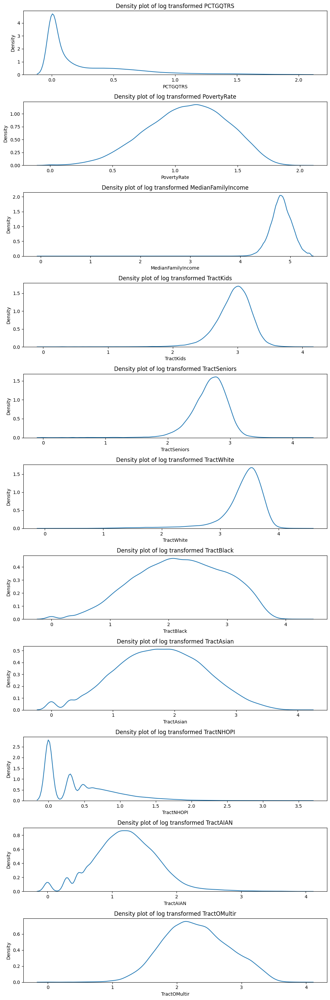

In [ ]:
fig, axes = plt.subplots(nrows=11, ncols=1, figsize=(10, 30))

# Use a loop to create a density plot to check distribution for each column
for i, ax in enumerate(axes.flatten()):
    if i < len(log10_df.columns):
        column = log10_df.columns[i]
        sns.kdeplot(data=log10_df, x=column, ax=ax)
        ax.set_title(f"Density plot of log transformed {column}")
        ax.set_xlabel(column)
        ax.set_ylabel("Density")

# Adjust the layout of the plots and show the figure
plt.tight_layout()
plt.show()

In [ ]:
# Add the log-transformed columns to df
# Rename columns in factors_log10 dataframe
log10_df.columns = ['log10_'+ str(col) for col in log10_df.columns]

fin_df = pd.concat([df, log10_df], axis=1)

fin_df.head()

,EastofUS,Urban,GroupQuartersFlag,LowIncomeTracts,PCTGQTRS,PovertyRate,MedianFamilyIncome,TractKids,TractSeniors,TractWhite,...,log10_TractSeniors,log10_TractWhite,log10_TractBlack,log10_TractAsian,log10_TractNHOPI,log10_TractAIAN,log10_TractOMultir,log10_TractHispanic,log10_TractHUNV,log10_TractSNAP
0,1,1,0,0,0.00,11.3,81250.0,507,221,1622,...,2.346353,3.210319,2.338456,1.176091,0.000000,1.176091,1.662758,1.653213,0.845098,2.012837
1,1,1,0,1,8.34,17.9,49000.0,606,214,888,...,2.332438,2.948902,3.085647,0.778151,0.000000,0.778151,1.748188,1.880814,1.954243,2.195900
2,1,1,0,0,0.00,15.0,62609.0,894,439,2576,...,2.643453,3.411114,2.811575,1.255273,0.778151,1.079181,2.071882,1.944483,2.000000,2.238046
3,1,1,0,0,0.00,2.8,70607.0,1015,904,4086,...,2.956649,3.611405,2.287802,1.278754,0.698970,1.079181,1.875061,1.934498,1.342423,1.995635
4,1,1,0,0,1.68,15.2,96334.0,3162,1126,8666,...,3.051924,3.937869,3.157759,2.472756,1.000000,1.690196,2.492760,2.551450,2.363612,2.531479


* Since we are not using `GroupQuartersFlag` for the dimension, we dropped this variable.

In [ ]:
fin_df = fin_df.drop(['GroupQuartersFlag'], axis=1)

fin_df.head()

,EastofUS,Urban,LowIncomeTracts,PCTGQTRS,PovertyRate,MedianFamilyIncome,TractKids,TractSeniors,TractWhite,TractBlack,...,log10_TractSeniors,log10_TractWhite,log10_TractBlack,log10_TractAsian,log10_TractNHOPI,log10_TractAIAN,log10_TractOMultir,log10_TractHispanic,log10_TractHUNV,log10_TractSNAP
0,1,1,0,0.00,11.3,81250.0,507,221,1622,217,...,2.346353,3.210319,2.338456,1.176091,0.000000,1.176091,1.662758,1.653213,0.845098,2.012837
1,1,1,1,8.34,17.9,49000.0,606,214,888,1217,...,2.332438,2.948902,3.085647,0.778151,0.000000,0.778151,1.748188,1.880814,1.954243,2.195900
2,1,1,0,0.00,15.0,62609.0,894,439,2576,647,...,2.643453,3.411114,2.811575,1.255273,0.778151,1.079181,2.071882,1.944483,2.000000,2.238046
3,1,1,0,0.00,2.8,70607.0,1015,904,4086,193,...,2.956649,3.611405,2.287802,1.278754,0.698970,1.079181,1.875061,1.934498,1.342423,1.995635
4,1,1,0,1.68,15.2,96334.0,3162,1126,8666,1437,...,3.051924,3.937869,3.157759,2.472756,1.000000,1.690196,2.492760,2.551450,2.363612,2.531479


In [ ]:
# # save the dataframe as xlsx file
# fin_df.to_excel('clean_data.xlsx', index=False)

### Findings 
* The original data of factors converted using a log10 tranformation.
* They show more normal distribution than original data and the ranges are reduced significantly.
* The `TractNHOPI` still appeared to be right-skewed due to the heavy right tail from the original data.

### Things to consider
* We may try other transformation for `TractNHOPI` such as natural log, cube root or Box-Cox to see if they better address the skewness.
* Alternatively, we may leave the data as is if the skewness is not deemed to be a significant issue for the analysis.